# Plotting Maps in pyshtools

pyshtools allows for the creation of publication quality images of geographical data with a minimum of effort. A basic image can be created simply by using the `plot()` method of an `SHGrid` class instance, and a variety of customizations can be specified by adding human-readable arguments. In this notebook, we demonstrate the major features of this plotting routine, which include

1. Colormaps
2. Colorbars
3. Ticks and Labels
4. Map Projections
5. Creating Subplots

To demonstrate these features, we will make use of a few optional modules that will need to be installed. [cartopy](https://scitools.org.uk/cartopy/docs/latest/index.html) and [pygmt](https://www.pygmt.org) allow for geographic projections, and [palettable](https://jiffyclub.github.io/palettable/) provides easy access to some useful [scientific color maps](http://www.fabiocrameri.ch/colourmaps.php).

In [1]:
import pyshtools as pysh
import matplotlib.pyplot as plt

from cartopy import crs as ccrs
import pygmt
from palettable import scientific as scm

%config InlineBackend.figure_format = 'retina'  # if you are not using a retina display, comment this line!

For our example, we will make use of the spherical harmonic coefficients of the shape of Mars. We read the coefficients from file, divide by 1000 to convert to km, set both the degree 0 and flattening terms to zero, expand the coefficients on a grid, and then plot the grid using default options.

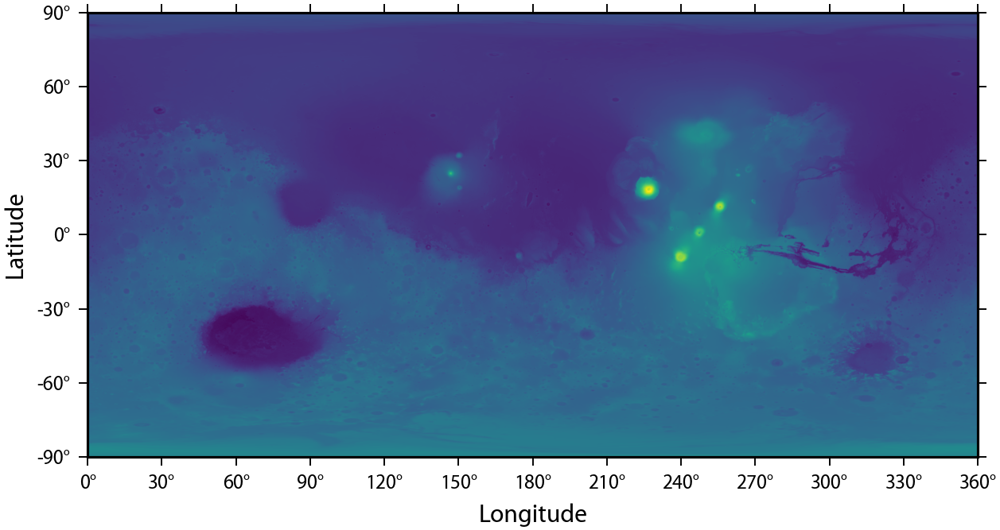

In [2]:
clm = pysh.SHCoeffs.from_file('../ExampleDataFiles/MarsTopo719.shape') / 1000.
clm.coeffs[0,0,0] = 0.
clm.coeffs[0,2,0] = 0.
grid = clm.expand()

fig, ax = grid.plot(show=False)  # show=False is used only to avoid warnings when executing as a jupter notebook

The `plot()` method returns a matplotlib figure and its corresponding axes. When projecting data using pygmt, only a `pygmt.Figure` instance is returned.

## 1. Colormaps

The default colormap for pyshtools is 'viridis', which is both perceptually uniform and optimized for people with the most common form of color-vision deficiency. The first thing we can do is to select a different colormap. When using matplotlib colormaps, it is only necessary to specify the argument `cmap` and provide the name (as a string) of the colormap. For this example, we choose the matplotlib colormap 'RdBu' that goes from red to blue:

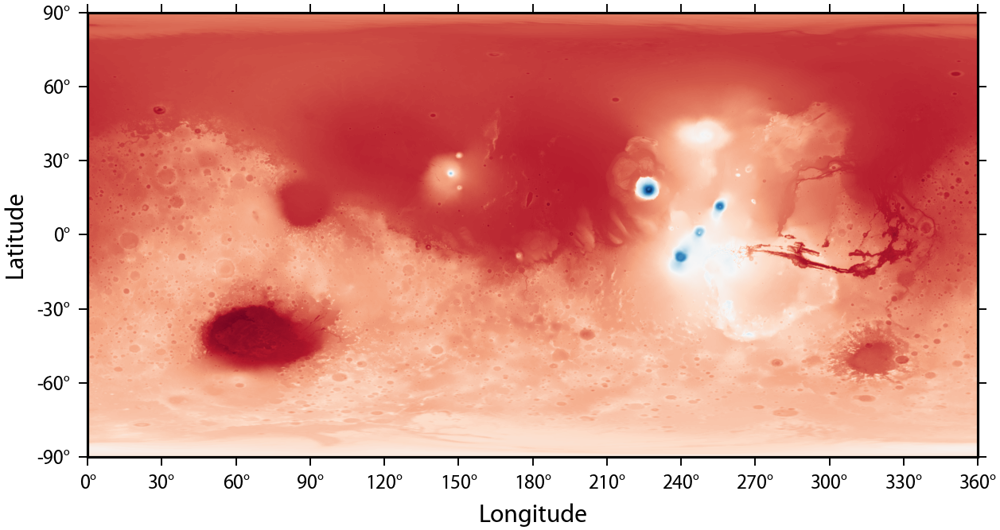

In [3]:
fig, ax = grid.plot(cmap='RdBu',
                    show=False)

You might find it odd that the hot colors are located at low elevations of the planet, so we can reverse the color progression with the option `cmap_reverse`:

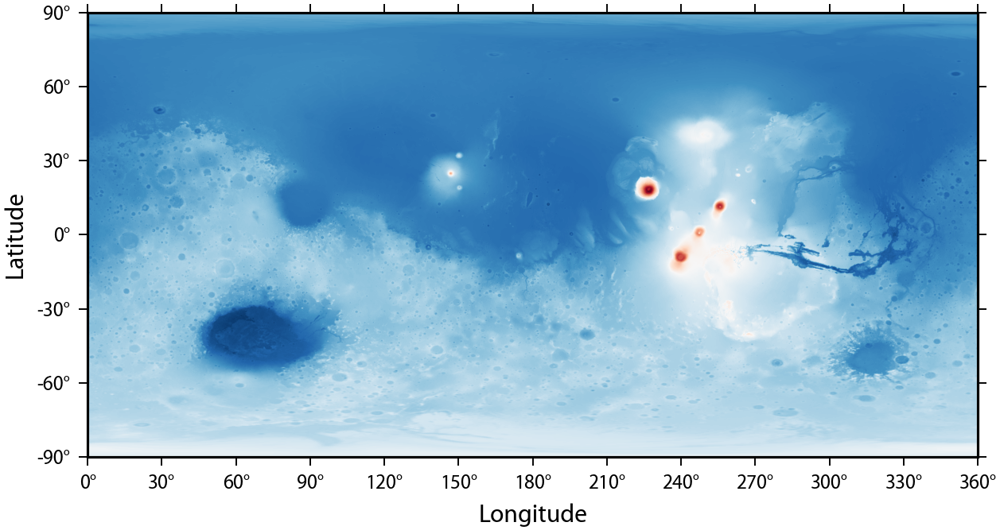

In [4]:
fig, ax = grid.plot(cmap='RdBu',
                    cmap_reverse=True,
                    show=False)

This looks more natural, but because of the high dynamic range of the surface relief in the volcanic Tharsis province, the majority of the image uses colors that cover only a small range of the colormap. We can change the minimum and maximum data values used in generating the colormap by use of the option `cmap_limits`, and here, we set the bounds to -6 and 10 km:

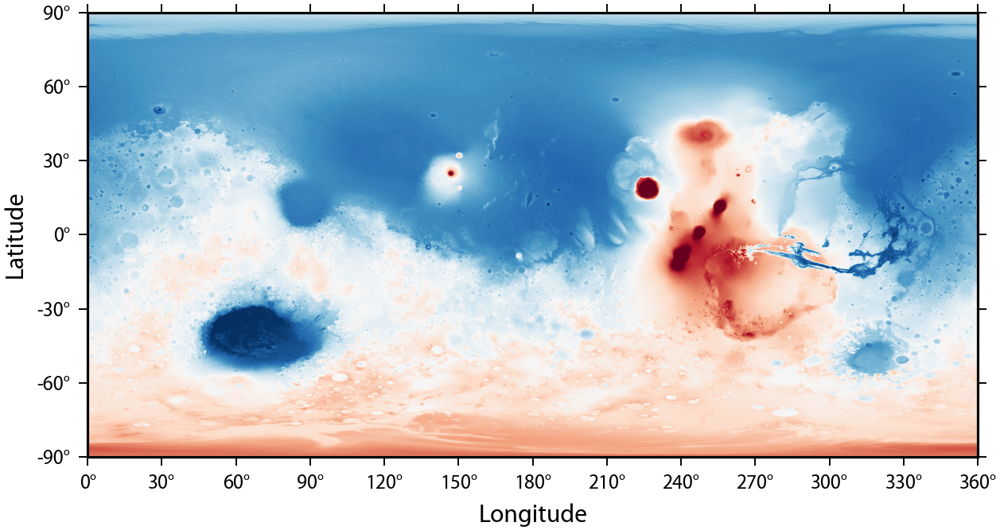

In [5]:
fig, ax = grid.plot(cmap='RdBu',
                    cmap_reverse=True,
                    cmap_limits=[-6, 10],
                    show=False)

The colormaps are by default continuous. To instead use a colormap with constant colors over a specified data interval, it is only necessary to add an optional interval to `cmap_limits`. Here, we use an interval of 2 km:

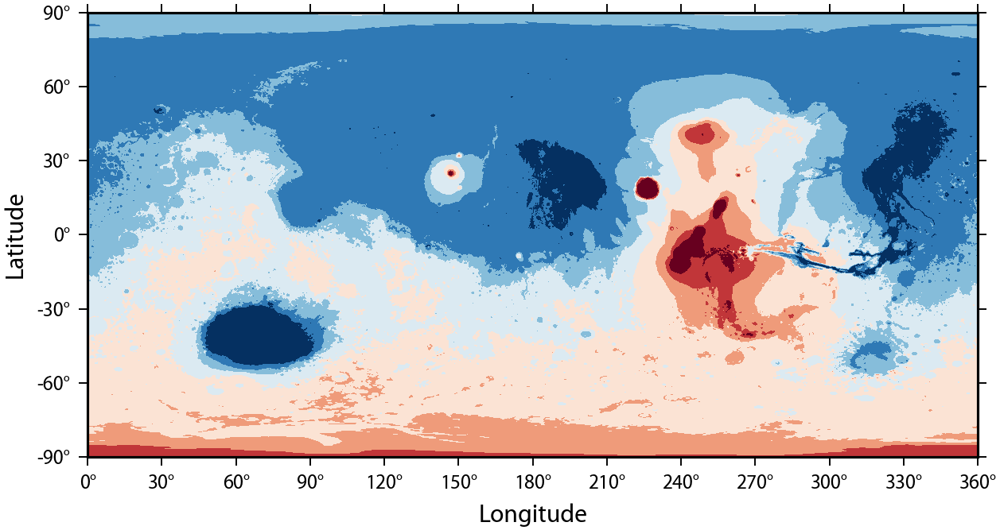

In [6]:
fig, ax = grid.plot(cmap='RdBu',
                    cmap_reverse=True,
                    cmap_limits=[-6, 10, 2],
                    show=False)

Lastly, you can also use your own custom matplotlib colormaps. Here we use one of the scientific color maps (which are all perceptually uniform), and convert it to matplotlib format by adding `.mpl_colormap`. The scientifitic color maps are categorized as being either diverging or sequential, and here we choose the diverging 'Vik' colormap (the number 20 specifies the number of entries in the look-up table):

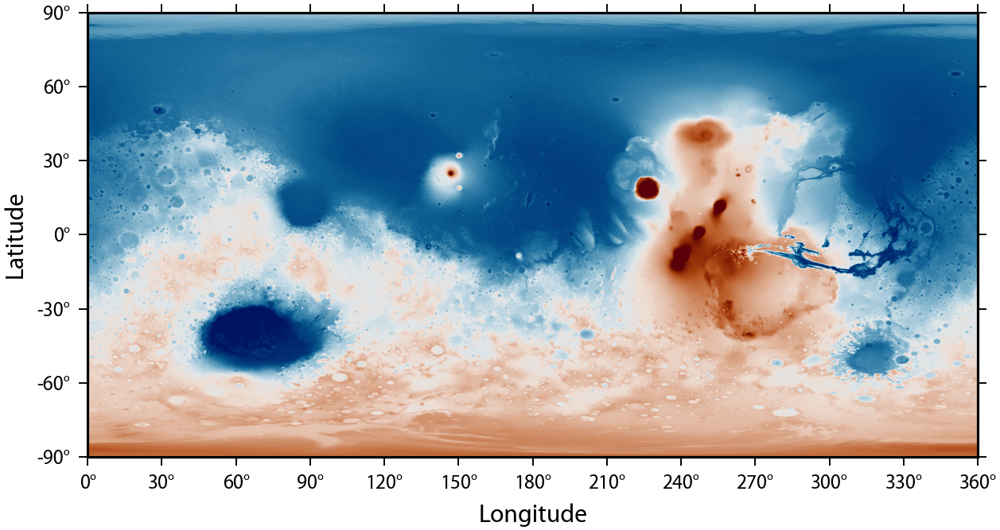

In [7]:
mycmap = scm.diverging.Vik_20.mpl_colormap
fig, ax = grid.plot(cmap=mycmap,
                    cmap_limits=[-6, 10],
                    show=False)

## 2. Colorbars

Colorbars are critical for interpretting the data plotted in an image. To add a colorbar to an image, it is only necessary to provide the argument `colorbar` with a value of 'top', 'bottom', 'left', or 'right':

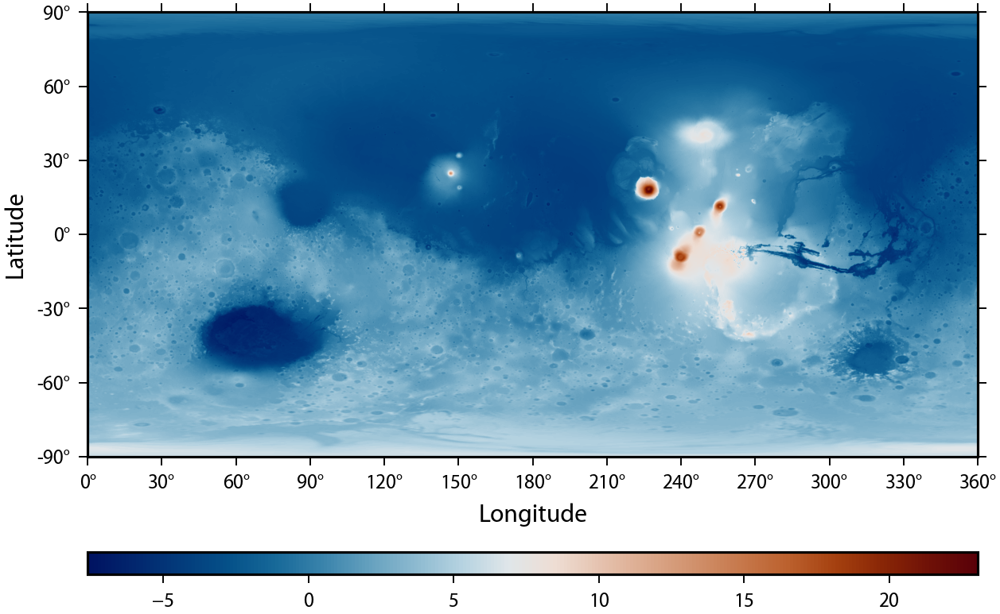

In [8]:
fig, ax = grid.plot(cmap=mycmap,
                    colorbar='bottom',
                    show=False)

This by itself is not to useful, because we don't know what is being plotted and what the units are. To add a label to the colorbar, it is only necessary to specify `cb_label`:

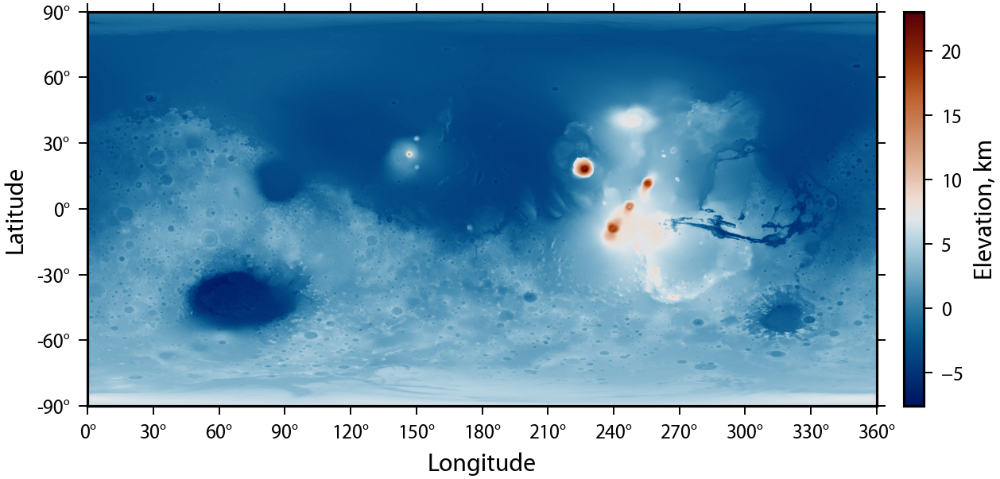

In [9]:
fig, ax = grid.plot(cmap=mycmap,
                    colorbar='right',
                    cb_label='Elevation, km',
                    show=False)

If you would instead like to specify the units on the top of the colorbar (or to the right for horizontal colorbars), you can specify `cb_ylabel`:

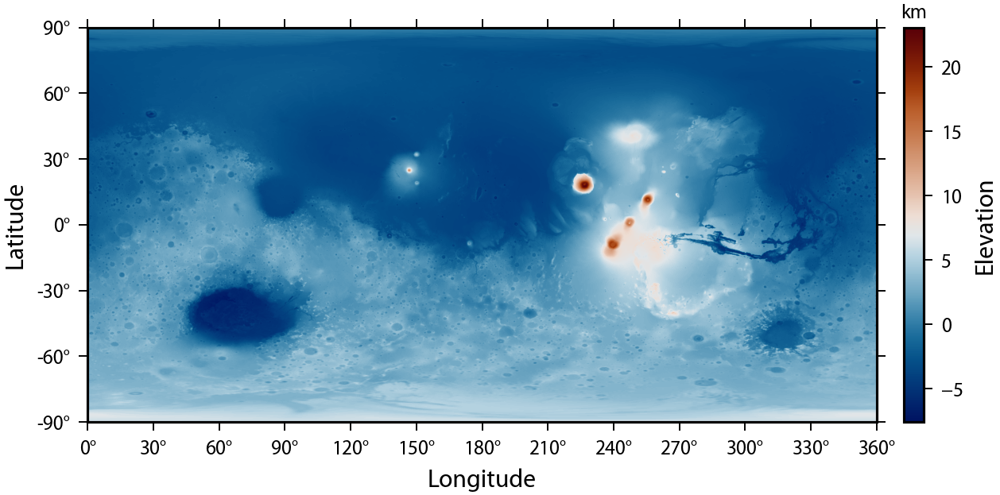

In [10]:
fig, ax = grid.plot(cmap=mycmap,
                    colorbar='right',
                    cb_label='Elevation',
                    cb_ylabel='km',
                    show=False)

Next, let's limit the color range that is being plotted using `cmap_limits`. Since the upper and lower values of the colorbar do not represent the maximum and minimum values of the data, we can provide triangles at the ends of the colorbar by providing `cb_triangles` with one of the options 'both', 'min', 'max', or 'neither':

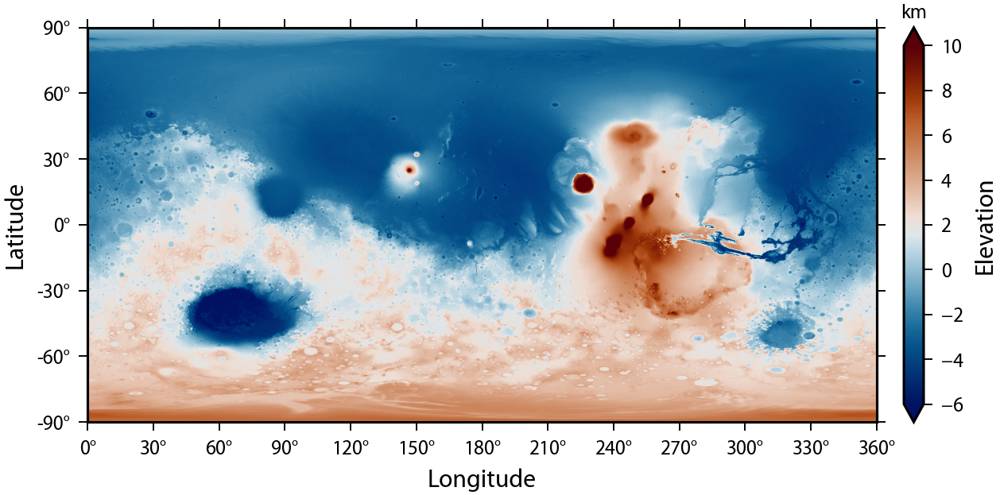

In [11]:
fig, ax = grid.plot(cmap=mycmap,
                    cmap_limits=[-6, 10],
                    colorbar='right',
                    cb_label='Elevation',
                    cb_ylabel='km',
                    cb_triangles='both',
                    show=False)

You might not like the values of the ticks and annotations plotted on the colorbar, and there are two ways to modify the default values. First, `cb_tick_interval` specifies the interval of the major ticks and annotations that are plotted. Secondly, `cb_minor_tick_interval` specifies the interval at which minor ticks are plotted. In this example, we plot annotations every 5 km and minor ticks every 2.5 km:  

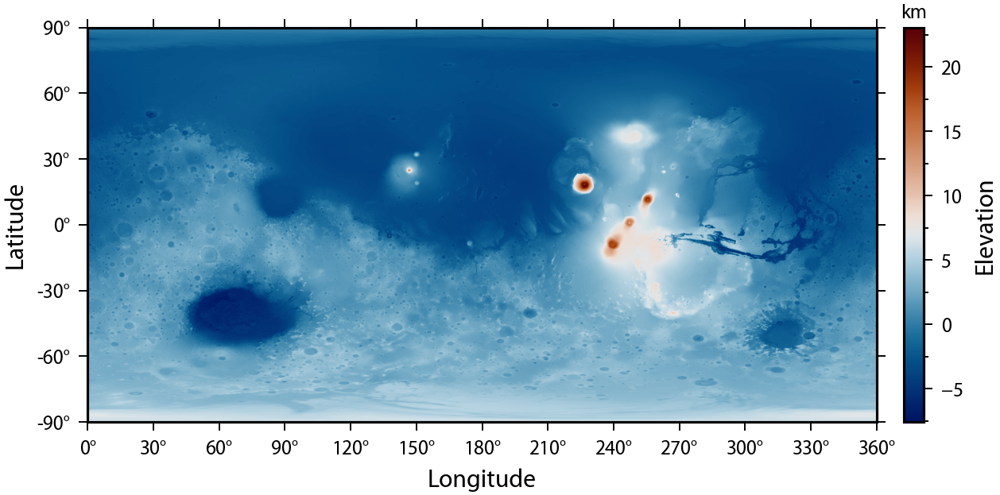

In [12]:
fig, ax = grid.plot(cmap=mycmap,
                    colorbar='right',
                    cb_label='Elevation',
                    cb_ylabel='km',
                    cb_tick_interval=5,
                    cb_minor_tick_interval=2.5,
                    show=False)

The spacing between the colorbar and map is computed automatically, as is the width of the colorbar. If you don't like the default values, you can specify your own offset in points using `cb_offset` (1 pt = 1/72 inches) and width in percentage of the respective axis using `cb_width`. Here we plot the same image as above, but set the offset to 4 pt and increase the width to 5% of the image width:

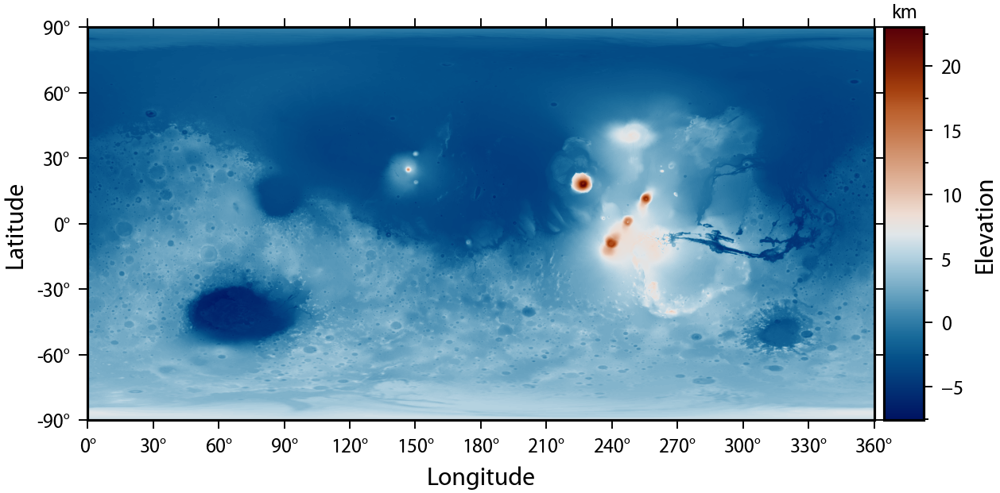

In [13]:
fig, ax = grid.plot(cmap=mycmap,
                    colorbar='right',
                    cb_label='Elevation',
                    cb_ylabel='km',
                    cb_tick_interval=5,
                    cb_minor_tick_interval=2.5,
                    cb_offset=4,
                    cb_width=5,
                    show=False)

## 3. Ticks and Labels

The `plot()` routine allows to customize several aspects regarding ticks, labels, and titles. Similar to the colorbar example above, we can change the major tick inverval (which determines where annotations and gridlines are plotted) and the minor tick interval. Since there are two axes (longitude and latitude), the options `tick_interval` and `minor_tick_interval` each take a list of two values. In this example, we change the major tick interval to 60 and 45 degrees respectively for the longitude and latitude axes, and set the minor tick intervals respectively to 30 and 15:

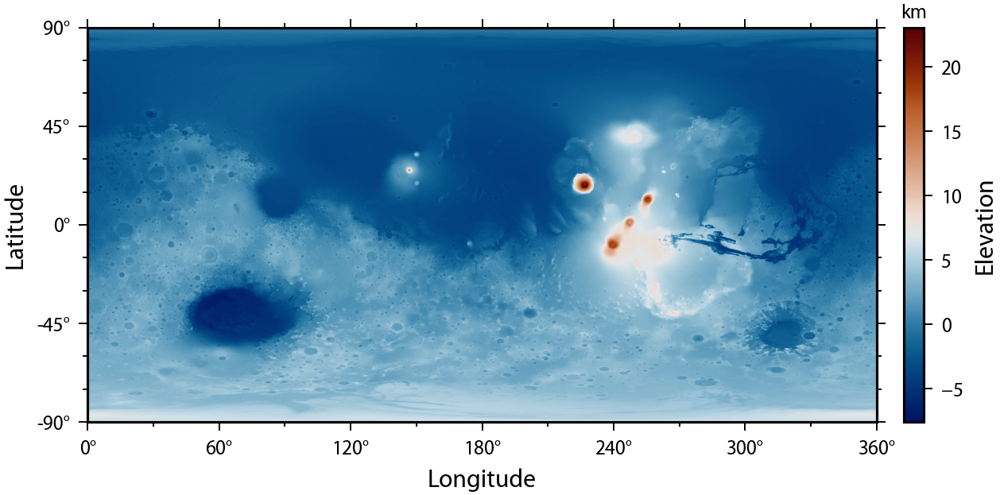

In [14]:
fig, ax = grid.plot(cmap=mycmap,
                    colorbar='right',
                    cb_label='Elevation',
                    cb_ylabel='km',
                    tick_interval=[60, 45],
                    minor_tick_interval=[30, 15],
                    show=False)

By default, major and minor ticks are plotted on all four boundaries of the map, and annotations are plotted on the western and southern edge of the map. This behavior can be changed by specifying `ticks` with a string of cardinal directions like 'WSen'. Captial letters in this string denote the plotting and annotation of ticks, whereas lower case letters denote plotting of ticks only. If the cardinal is not present, then neither ticks nor annotations will be plotted. In this example, we plot annotations and ticks on the north and south axis, we ommit ticks on the east axis, and we plot ticks on the west axes using 'NwS':

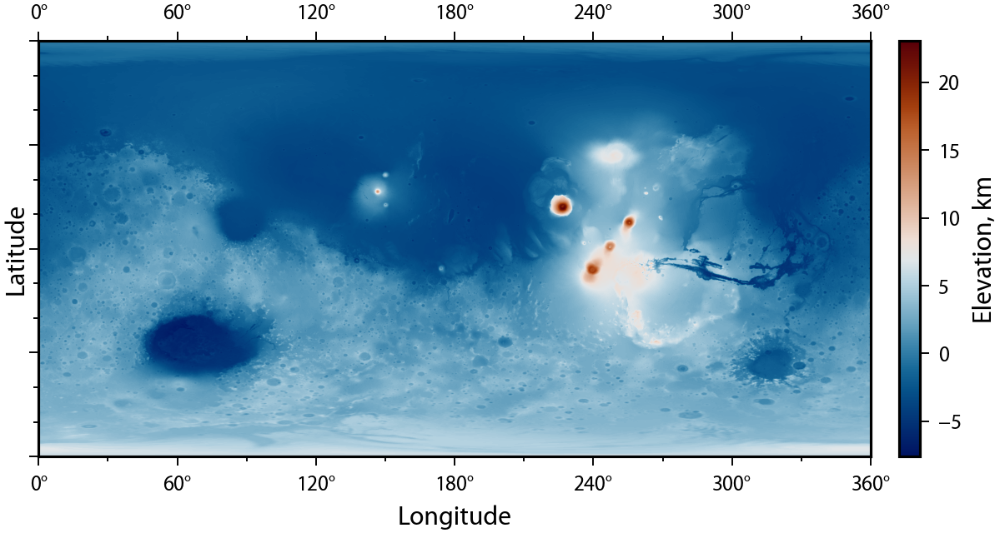

In [15]:
fig, ax = grid.plot(cmap=mycmap,
                    colorbar='right',
                    cb_label='Elevation, km',
                    tick_interval=[60, 45],
                    minor_tick_interval=[30, 15],
                    ticks='NwS',
                    show=False)

The axis lables and associated fontsizes can all be modified. Longitude and latitude labels are modified using respecitvely `xlabel` and `ylabel`, and the font sizes of both of these (as well as the colorbar label) are controlled by `axes_labelsize`. Furthermore, the font size of the major tick annotations is controlled by the parameter `tick_labelsize`. In this example, we remove the latitude axis label, we change the longitude axis label, we change the font size of all axis labels to 8 pt, and we decrease the tick annotation font size to 6 pt:

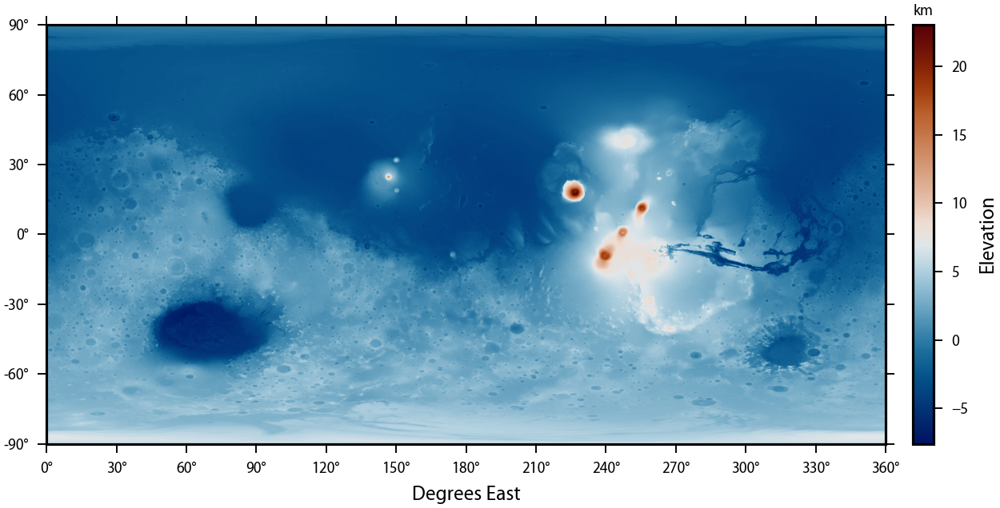

In [16]:
fig, ax = grid.plot(cmap=mycmap,
                    colorbar='right',
                    cb_label='Elevation',
                    cb_ylabel='km',
                    xlabel='Degrees East',
                    ylabel=None,
                    axes_labelsize=8,
                    tick_labelsize=6,
                    show=False)

A title can be added to the plot by specifying `title`, and it's font size can be controlled by `titlesize`. Lastly, we note that gridlines can be plotted at the major tick intervals by specifying `grid`:

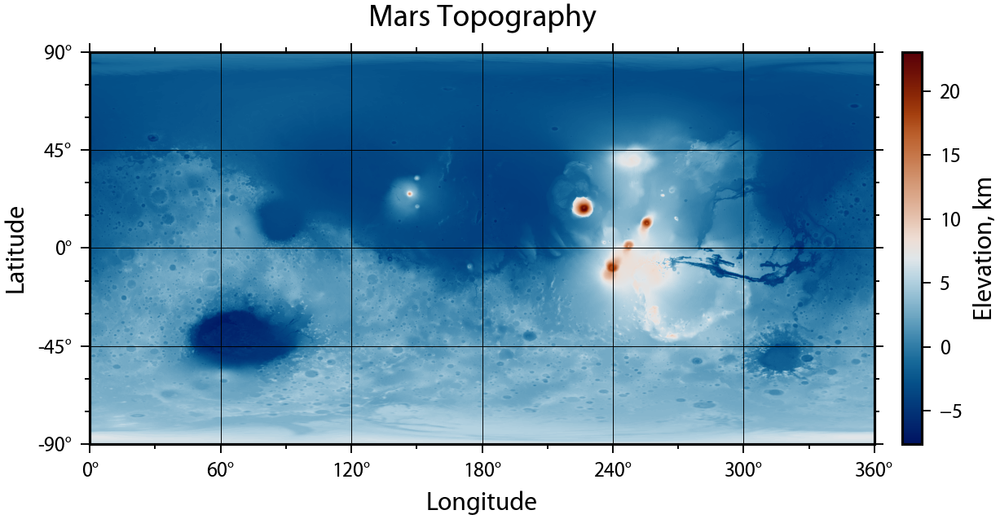

In [17]:
fig, ax = grid.plot(cmap=mycmap,
                    tick_interval=[60, 45],
                    minor_tick_interval=[30, 15],
                    colorbar='right',
                    cb_label='Elevation, km',
                    grid=True,
                    title='Mars Topography',
                    titlesize=12,
                    show=False)

## 4. Map Projections

To plot a gridded dataset using a geographic projection, it is only necessary to specify the option `projection`. For the `plot()` method, this must be a `cartopy.crs.Projection` class instance, and a list of available projections can be found [here](https://scitools.org.uk/cartopy/docs/latest/crs/projections.html). The cartopy map projection for an equidistant projection in degrees latitude and longitude is called 'PlateCarree' (which is french for a 'flat square'), and this projection requires that you specify the central longitude. In this example, we project the data using a PlateCarree projection with a central longitude of 240 degrees, which corresponds to the center of the Tharsis plateau:

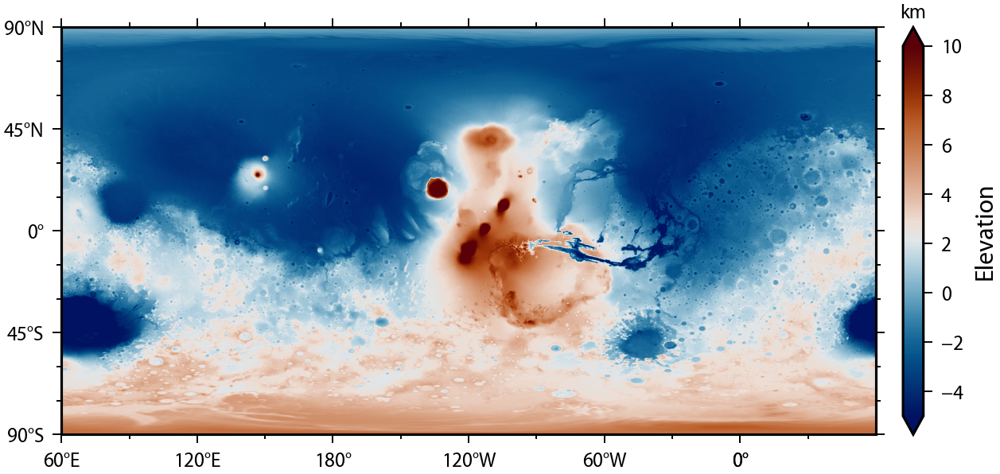

In [18]:
fig, ax = grid.plot(cmap=mycmap,
                    projection=ccrs.PlateCarree(central_longitude=240.),
                    cmap_limits=[-5, 10],
                    tick_interval=[60, 45],
                    minor_tick_interval=[30, 15],
                    colorbar='right',
                    cb_label='Elevation',
                    cb_ylabel='km',
                    cb_triangles='both',
                    show=False)

When using cartopy, the tick labels are formatted somewhat differently (see [this](https://scitools.org.uk/cartopy/docs/latest/matplotlib/gridliner.html) documentation), and axis labels are ommitted. It is trivial to change the projection, and here we use a Mollweide projection with added grid lines:

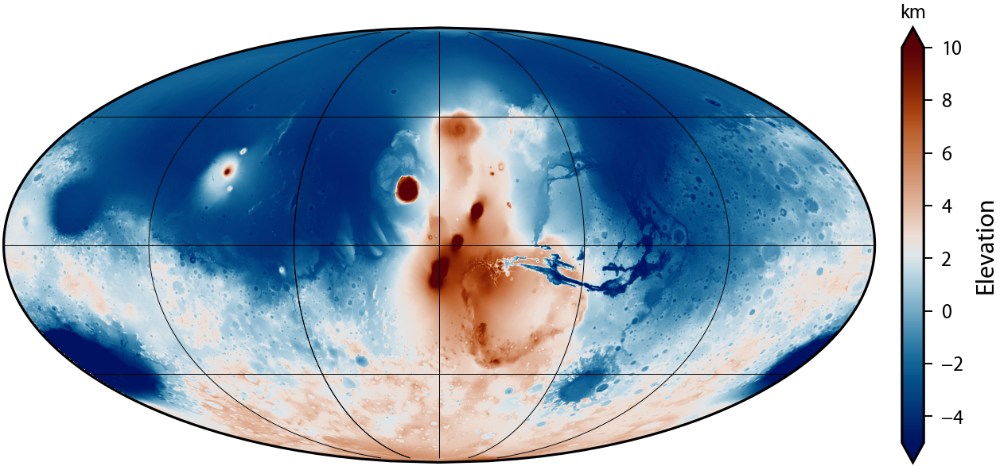

In [19]:
fig, ax = grid.plot(projection=ccrs.Mollweide(central_longitude=240.),
                    cmap=mycmap,
                    cmap_limits=[-5, 10],
                    tick_interval=[60, 45],
                    colorbar='right',
                    cb_label='Elevation',
                    cb_ylabel='km',
                    cb_triangles='both',
                    grid=True,
                    show=False)

You can also project your data using pygmt, which is a python interface to the [generic mapping tools](https://www.generic-mapping-tools.org/) that are commonly used in the geosciences. pygmt is still in an experimental phase, so at the present time, this is accessible in pyshtools by using a separate method `plotgmt()`. As the pygmt implementation improves, this will eventually be incorporated into the generic `plot()` method. 

The arguments of `plotgmt()` are nearly identical to those of `plot()`: a few differences inlcude the arguments `central_longitude`, `cmap_continuous` to specify whether the colormap should be continuous or not, and `offset` that determines where on the postscript figure the image should be plotted. Furthermore, when specifying a colormap, you must use the name (as a string) of one of the CPT colormaps internally supported by gmt (a list of supported colormaps can be found [here](https://docs.generic-mapping-tools.org/latest/cookbook/cpts.html)). As opposed to the above examples that return a matplotlib figure and axes, only a `pygmt.Figure` instance is returned when using pygmt. To display this figure to the screen, you must use `fig.show()` in a notebook, or `fig.show(method='external')` in the terminal. In this example, we plot nearly the same image as above, using only a very slight modification of the optional parameters:

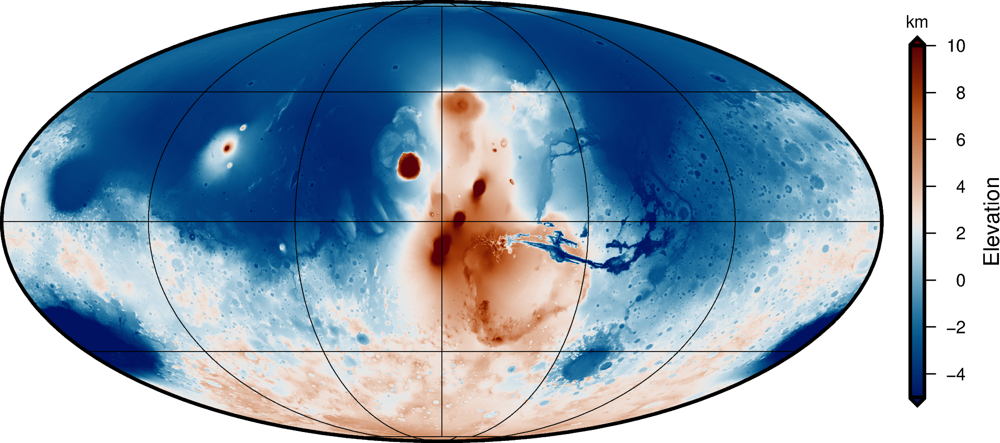

In [20]:
fig = grid.plotgmt(projection='mollweide',
                   central_longitude=240.,
                   cmap='vik',
                   cmap_limits=[-5, 10],
                   tick_interval=None,
                   colorbar='right',
                   cb_label='Elevation',
                   cb_ylabel='km',
                   cb_triangles='both',
                   cb_tick_interval=2,
                   grid=[60, 45])
fig.show()

## Creating Subplots

It is easy to create arrays of images in pyshtools, or to add an image to a pre-existing figure. When using matplotlib/cartopy to create an image, this is done by first creating a figure and its associated axes, and then specifying the axis in the `plot()` method with the option `ax`. In this example, we first create a figure with two adjacent axes using `plt.subplots()`, and then plot two different images into these axes:

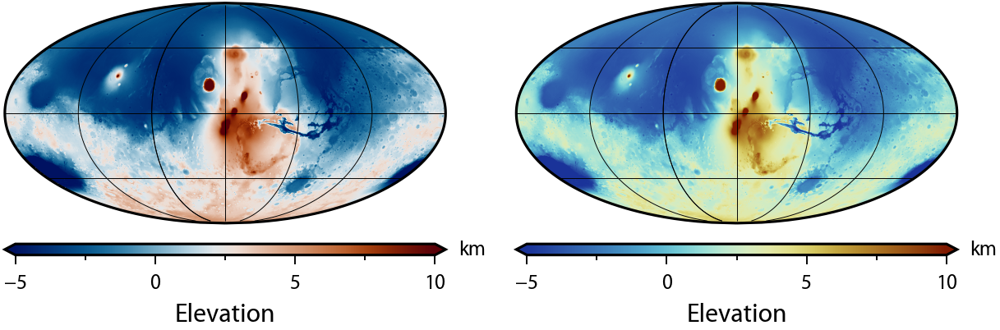

In [21]:
fig, ax = plt.subplots(1,2)
grid.plot(projection=ccrs.Mollweide(central_longitude=240.),
                    cmap=mycmap,
                    cmap_limits=[-5, 10],
                    tick_interval=[60, 45],
                    colorbar='bottom',
                    cb_label='Elevation',
                    cb_ylabel='km',
                    cb_triangles='both',
                    cb_tick_interval=5.,
                    cb_minor_tick_interval=2.5,
                    cb_offset=8,
                    grid=True,
                    ax=ax[0])
grid.plot(projection=ccrs.Mollweide(central_longitude=240.),
                    cmap=scm.diverging.Roma_20.mpl_colormap,
                    cmap_reverse=True,
                    cmap_limits=[-5, 10],
                    tick_interval=[60, 45],
                    colorbar='bottom',
                    cb_label='Elevation',
                    cb_ylabel='km',
                    cb_triangles='both',
                    cb_tick_interval=5.,
                    cb_minor_tick_interval=2.5,
                    cb_offset=8,
                    grid=True,
                    ax=ax[1])
fig.tight_layout()

The approach is somewhat different when using pygmt. First, a pygmt Figure instance needs to be created using `pygmt.Figure()`, and this figure is then specified in the `plotgmt()` method using the option `fig`. For each successive call of `plotgmt()` it is then necessary to specify `offset` which is a list that determines how much the subplot will be shifted with respect to the previous image in the x and y directions (in inches):

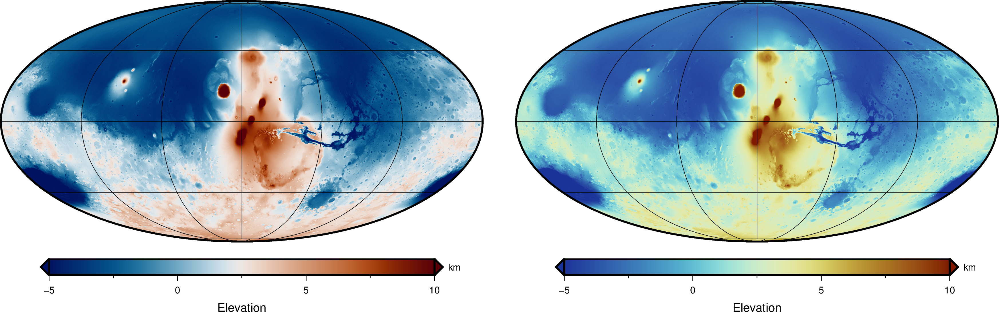

In [22]:
fig = pygmt.Figure()
grid.plotgmt(projection='mollweide',
             central_longitude=240.,
             cmap='vik',
             cmap_limits=[-5, 10],
             tick_interval=None,
             colorbar='bottom',
             cb_label='Elevation',
             cb_ylabel='km',
             cb_triangles='both',
             cb_tick_interval=5.,
             cb_minor_tick_interval=2.5,
             cb_offset=15,
             grid=[60, 45],
             fig=fig)
grid.plotgmt(projection='mollweide',
             central_longitude=240.,
             cmap='roma',
             cmap_limits=[-5, 10],
             cmap_reverse=True,
             tick_interval=None,
             colorbar='bottom',
             cb_label='Elevation',
             cb_ylabel='km',
             cb_triangles='both',
             cb_tick_interval=5.,
             cb_minor_tick_interval=2.5,
             cb_offset=15,
             grid=[60, 45],
             fig=fig,
             offset=[6, 0])
fig.show()